# CS5228: Final Project (TeamMaverick)

In this notebook, we will perform the following:
- Exploratory data analysis 
- Preprocessing

# 1. Import Libraries

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import os
import opendatasets as od
from pathlib import Path
import pickle 

import pandas as pd
import numpy as np
import re

import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
import folium

from src.utils import check_shape, highlight_top, missing_values_table, save_fig, clean_property_type
from src.preprocessing import clean_property_type, fill_missing_values, update_data, drop_columns, create_features

In [3]:
pd.set_option('display.max_columns', None)

# 2. Download Data

In [4]:
#od.download("https://www.kaggle.com/competitions/cs5228-2022-semester-1-final-project")

In [5]:
#os.rename('cs5228-2022-semester-1-final-project', 'raw_data')

# 3. Configurations

In [6]:
sns.set_theme(style="ticks")
sns.set_context("paper", rc={"xtick.labelsize":15,
                             "ytick.labelsize":15,
                             "axes.titlesize":20,
                             "axes.labelsize":15})
default_col = '#4c72b0'
highlight_col = '#c44d52'

In [7]:
# create a folder for plots
os.makedirs("images", exist_ok=True)

In [8]:
data_dir = Path("./raw_data/")
img_dir = Path("./images/")

# 4. Exploratory Data Analysis

## 4.1 Summary Statistics

In [9]:
df_train = pd.read_csv(Path(data_dir, "train.csv"))
df_test = pd.read_csv(Path(data_dir, "test.csv"))
df_subzone = pd.read_csv(Path(data_dir, "auxiliary-data", "sg-subzones.csv"))

df_train_aux = pd.read_csv(Path(data_dir, 'train_auxiliary_data.csv'), index_col=0)
df_train = df_train.join(df_train_aux)

In [10]:
df_train_cleaned = df_train.copy()

In [11]:
df_train_cleaned.head()

,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area,price,dist_meters_to_nearest_mrt,nearest_mrt_code,nearest_mrt_line,dist_meters_to_nearest_mall,nearest_mall_index,dist_meters_to_nearest_commercial_centre,nearest_commercial_centre_index,dist_meters_to_nearest_primary_school,nearest_primary_school_index,dist_meters_to_nearest_secondary_school,nearest_secondary_school_index
0,122881,hdb flat for sale in 866 yishun street 81,sembawang / yishun (d27),866 yishun street 81,hdb 4 rooms,NaN,1988.0,3.0,2.0,1115,NaN,unspecified,NaN,116.0,https://www.99.co/singapore/hdb/866-yishun-str...,1.414399,103.837196,0,yishun south,yishun,514500.0,573.566928,ns14,ns,620.066152,103,3342.136748,2,274.527938,99,182.562453,88
1,259374,hdb flat for sale in 506b serangoon north aven...,hougang / punggol / sengkang (d19),hdb-serangoon estate,hdb,99-year leasehold,1992.0,4.0,2.0,1575,NaN,unspecified,"1, 2, 3, 4, 5, 6 br",NaN,https://www.99.co/singapore/hdb/hdbserangoon-e...,1.372597,103.875625,0,serangoon north,serangoon,995400.0,1728.895028,ne13,ne,551.705560,113,2388.871680,31,122.819531,130,290.331371,15
2,665422,4 bed condo for sale in meyerhouse,128 meyer road,meyerhouse,condo,freehold,2022.0,4.0,6.0,3070,low,partial,"studio, 3, 4, 5, 6 br",56.0,https://www.99.co/singapore/condos-apartments/...,1.298773,103.895798,0,mountbatten,marine parade,8485000.0,1315.256431,cc8,cc,822.517804,72,2159.421533,30,888.509938,147,891.530935,32
3,857699,3 bed condo for sale in leedon green,26 leedon heights,leedon green,Condo,freehold,2023.0,3.0,2.0,958,NaN,partial,"studio, 1, 2, 3, 4 br",638.0,https://www.99.co/singapore/condos-apartments/...,1.312364,103.803271,0,farrer court,bukit timah,2626000.0,723.885330,cc20,cc,907.845081,19,1605.948865,28,1086.151844,97,1102.475585,100
4,216061,2 bed condo for sale in one bernam,1 bernam street,one bernam,condo,99-year leasehold,2026.0,2.0,1.0,732,NaN,unspecified,"studio, 1, 2, 3, 4, 5 br",351.0,https://www.99.co/singapore/condos-apartments/...,1.273959,103.843635,0,anson,downtown core,1764000.0,370.021700,ew15,ew,428.960960,51,1864.412456,0,464.744201,20,1542.648854,89


In [12]:
df_train_cleaned.dtypes

listing_id                                    int64
title                                        object
address                                      object
property_name                                object
property_type                                object
tenure                                       object
built_year                                  float64
num_beds                                    float64
num_baths                                   float64
size_sqft                                     int64
floor_level                                  object
furnishing                                   object
available_unit_types                         object
total_num_units                             float64
property_details_url                         object
lat                                         float64
lng                                         float64
elevation                                     int64
subzone                                      object
planning_are

In [13]:
df_train_cleaned.describe()

,listing_id,built_year,num_beds,num_baths,size_sqft,total_num_units,lat,lng,elevation,price,dist_meters_to_nearest_mrt,dist_meters_to_nearest_mall,nearest_mall_index,dist_meters_to_nearest_commercial_centre,nearest_commercial_centre_index,dist_meters_to_nearest_primary_school,nearest_primary_school_index,dist_meters_to_nearest_secondary_school,nearest_secondary_school_index
count,20254.000000,19332.000000,20174.000000,19820.000000,2.025400e+04,14602.000000,20254.000000,20254.000000,20254.0,2.025400e+04,20254.000000,20254.000000,20254.000000,20254.000000,20254.000000,20254.000000,20254.000000,20254.000000,20254.000000
mean,550763.206428,2010.833695,3.122931,2.643542,1.854364e+03,376.253938,1.434282,103.855356,0.0,5.228263e+06,787.468535,794.342068,83.064432,1916.877238,21.230127,739.845545,76.029031,821.941179,66.520539
std,258874.420108,15.822803,1.281658,1.473835,1.354343e+04,346.882474,1.558472,3.593441,0.0,2.779748e+08,554.484635,529.336916,44.837200,1059.407083,11.825248,535.105319,53.541194,615.857307,41.519889
min,100043.000000,1963.000000,1.000000,1.000000,0.000000e+00,4.000000,1.239621,-77.065364,0.0,0.000000e+00,5.257545,0.000000,2.000000,89.629657,0.000000,0.000000,0.000000,0.000000,0.000000
25%,326279.000000,2000.000000,2.000000,2.000000,8.070000e+02,106.000000,1.307329,103.806576,0.0,8.190000e+05,401.576118,401.713836,51.000000,1168.954175,11.000000,371.143964,22.000000,430.393277,29.000000
50%,551397.000000,2017.000000,3.000000,2.000000,1.119000e+03,296.000000,1.329266,103.841552,0.0,1.680000e+06,658.704159,678.778647,86.000000,1681.479925,26.000000,605.146080,73.000000,685.288802,73.000000
75%,774044.500000,2023.000000,4.000000,3.000000,1.528000e+03,561.000000,1.372461,103.881514,0.0,3.242400e+06,999.991303,1039.295840,116.000000,2423.052923,30.000000,997.606995,126.000000,1029.960484,100.000000
max,999944.000000,2028.000000,10.000000,10.000000,1.496000e+06,2612.000000,69.486768,121.023232,0.0,3.924243e+10,4113.783288,4028.204443,164.000000,5797.965651,37.000000,4009.378093,179.000000,4442.112669,147.000000


In [14]:
num_points, num_attributes = df_train_cleaned.shape
check_shape(df_train_cleaned)

There are 20254 data points and 32 features


From the summary statistics, we noticed that there are a couple of things off about this dataset.
- The minimum value of ``size_sqft`` and ``price`` is 0 which is not possible. Also, the maximum value for both feature are very far off from the 75th percentile which might be an indication of outlier. 
- The standard deviation of ``price`` is also very large which indicates that the prices vary widely.

## 4.2 Univariate Analysis

### Target Variable

Saving figure boxplot_target


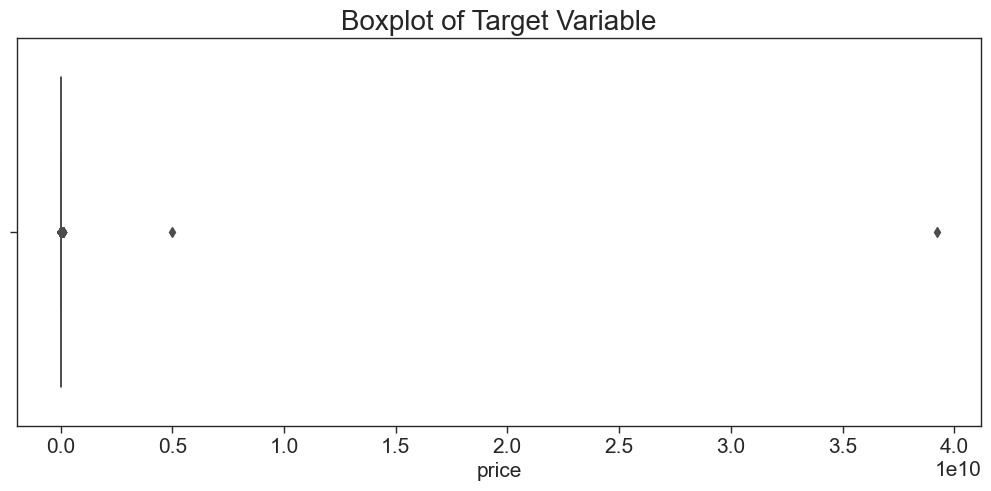

In [15]:
fig, ax = plt.subplots(figsize=(10,5))
sns.boxplot(x=df_train_cleaned["price"]).set_title("Boxplot of Target Variable")
save_fig("boxplot_target", img_dir)
plt.show()

- There are two extreme outliers. Let's look into the two outliers and see if they are indeed outliers

In [16]:
df_train_cleaned[df_train_cleaned["price"] > 0.4*10**10]

,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area,price,dist_meters_to_nearest_mrt,nearest_mrt_code,nearest_mrt_line,dist_meters_to_nearest_mall,nearest_mall_index,dist_meters_to_nearest_commercial_centre,nearest_commercial_centre_index,dist_meters_to_nearest_primary_school,nearest_primary_school_index,dist_meters_to_nearest_secondary_school,nearest_secondary_school_index
5976,385586,hdb flat for sale in 238 compassvale walk,hougang / punggol / sengkang (d19),compassvale plains,hdb 4 rooms,99-year leasehold,1999.0,1.0,10.0,232,NaN,unspecified,"1, 3, 4 br",NaN,https://www.99.co/singapore/hdb/compassvale-pl...,1.390556,103.898921,0,sengkang town centre,sengkang,3.924243e+10,402.610928,ne16,ne,470.88546,107,1714.600371,12,139.248128,135,411.897941,111
16264,287109,hdb flat for sale in 238 compassvale walk,hougang / punggol / sengkang (d19),compassvale plains,hdb 4 rooms,99-year leasehold,1999.0,1.0,10.0,129,NaN,unspecified,"1, 3, 4 br",NaN,https://www.99.co/singapore/hdb/compassvale-pl...,1.390556,103.898921,0,sengkang town centre,sengkang,4.985919e+09,402.610928,ne16,ne,470.88546,107,1714.600371,12,139.248128,135,411.897941,111


- We see both transactions are HDB 4 rooms. It is highly unlikely that a HDB will be able to fetch that high value.
- We will remove the two outliers from our dataset

In [17]:
df_train_cleaned = df_train_cleaned[df_train_cleaned["price"] <= 0.4*10**10]

- We see that there are also 101 records with zero price. Since they contain no information about the target variable for our model training, we will remove them as well.

In [18]:
print(f'There are {df_train_cleaned[df_train_cleaned.price == 0].shape[0]} records with zero price before cleaning.')
df_train_cleaned = df_train_cleaned[df_train_cleaned["price"] > 0]

There are 101 records with zero price before cleaning.


In [19]:
check_shape(df_train_cleaned)

There are 20151 data points and 32 features


- The distribution of price is very skewed and could be an indicator of outliers. We will explore further in the bivaraite analysis section

Saving figure dist_target


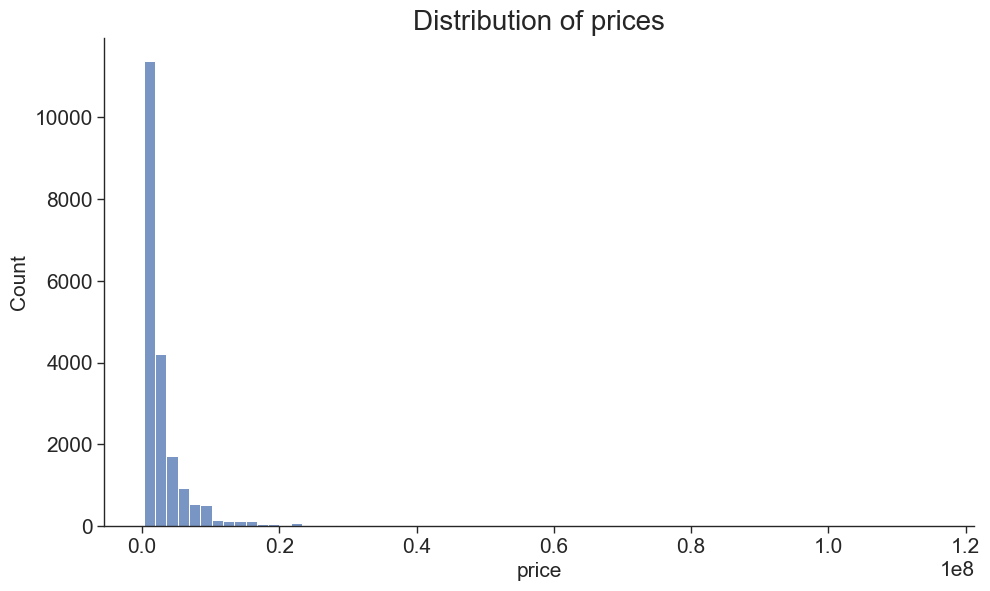

In [20]:
fig, ax = plt.subplots(figsize=(10,6))
sns.despine(fig)
ax = sns.histplot(df_train_cleaned["price"], 
             bins=70)
plt.title("Distribution of prices")
save_fig("dist_target", img_dir)
plt.show()


### Size Square Feet

Saving figure boxplot_size_sqft


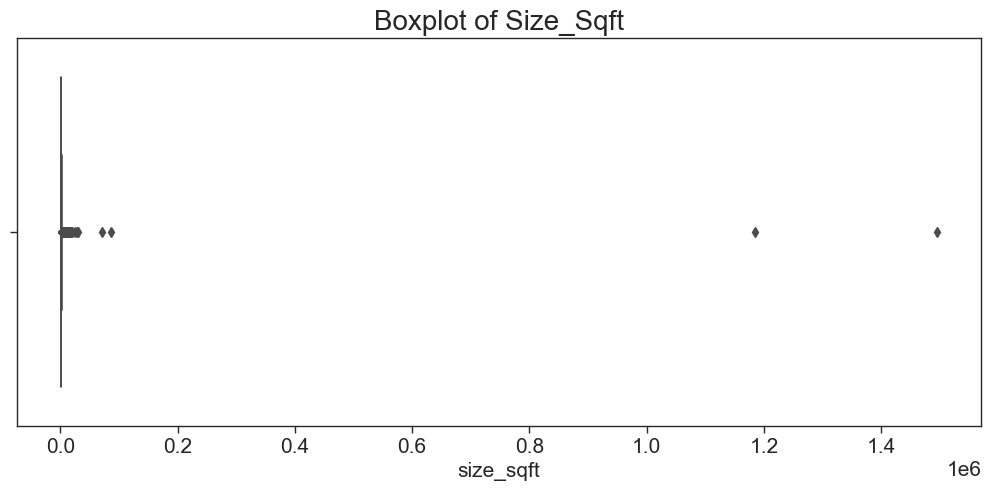

In [21]:
fig, ax = plt.subplots(figsize=(10,5))
sns.boxplot(x=df_train_cleaned["size_sqft"]).set_title("Boxplot of Size_Sqft")
save_fig("boxplot_size_sqft", img_dir)
plt.show()


- There are two extreme outliers. Let us look into these two outliers to determine if they are indeed outliers

In [22]:
df_train_cleaned[df_train_cleaned["size_sqft"] > 1*10**6]

,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area,price,dist_meters_to_nearest_mrt,nearest_mrt_code,nearest_mrt_line,dist_meters_to_nearest_mall,nearest_mall_index,dist_meters_to_nearest_commercial_centre,nearest_commercial_centre_index,dist_meters_to_nearest_primary_school,nearest_primary_school_index,dist_meters_to_nearest_secondary_school,nearest_secondary_school_index
2701,160293,3 bed condo for sale in jlb residences,169 jalan loyang besar,jlb residences,condo,946-year leasehold,2008.0,3.0,2.0,1185000,NaN,unfurnished,3 br,36.0,https://www.99.co/singapore/condos-apartments/...,1.379105,103.960613,0,pasir ris park,pasir ris,1244200.0,1427.822913,ew1,ew,690.937121,67,1610.535021,13,791.663379,21,713.430127,90
18446,771950,4 bed condo for sale in avenue south residence,1 silat avenue,avenue south residence,condo,99-year leasehold,2023.0,4.0,4.0,1496000,NaN,unspecified,"studio, 1, 2, 3, 4 br",1074.0,https://www.99.co/singapore/condos-apartments/...,1.304855,103.773776,0,dover,queenstown,3040800.0,904.064150,ew22,ew,872.136590,163,838.584713,35,1394.613296,49,556.372035,82


- Both of them are condo units. Let's try to see what is the average condo size.

In [23]:
df_train_cleaned[df_train_cleaned["property_type"] == "condo"]["size_sqft"].mean()

1499.8637236084453

- Both data points have the same property type and we see that the mean ``size_sqft`` for condo is 1495. 
- This makes those two data points outliers since their ``size_sqft`` deviates too far away from the mean of a typical condo.
- Also, as seen earlier in the summary statistics, there are units with ``size_sqft`` == 0 which is not possible. We will remove those as well.

In [24]:
# remove the two outliers
df_train_cleaned = df_train_cleaned[df_train_cleaned["size_sqft"] <= 1*10**6]

# remove data points with size_sfft == 0
df_train_cleaned = df_train_cleaned[df_train_cleaned["size_sqft"] != 0]

In [25]:
check_shape(df_train_cleaned)

There are 20149 data points and 32 features


### Built Year

Saving figure dist_built_year


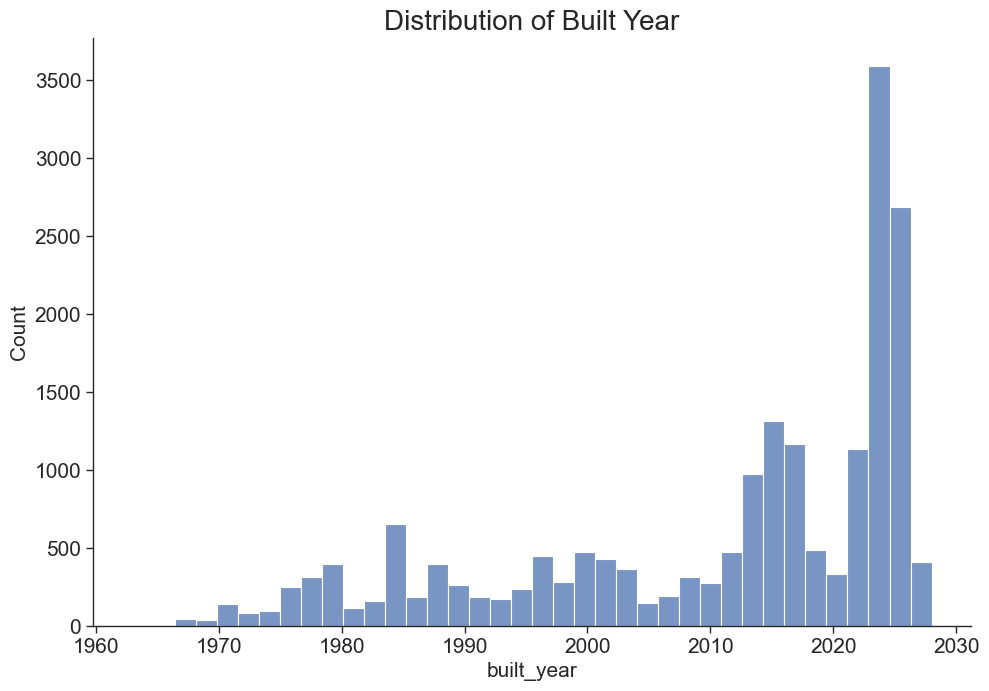

In [26]:
fig, ax = plt.subplots(figsize=(10,7))
sns.despine()
sns.histplot(df_train_cleaned["built_year"]).set_title("Distribution of Built Year")
save_fig("dist_built_year", img_dir)
plt.show()


- There are units with built_year beyond our current year 2022. However, since there are so many of those, it could be that those are the TOP year. This means that those units beyond 2022 are for future sales. We shall not remove those data

In [27]:
df_train_cleaned[df_train_cleaned["built_year"] > 2022]["built_year"].value_counts()

2023.0    2128
2025.0    1524
2024.0    1461
2026.0    1159
2027.0     381
2028.0      31
Name: built_year, dtype: int64

In [28]:
#df_train_cleaned = df_train_cleaned[df_train_cleaned["built_year"] <= 2022]

In [29]:
#check_shape(df_train_cleaned)

### Tenure

Saving figure count_tenure


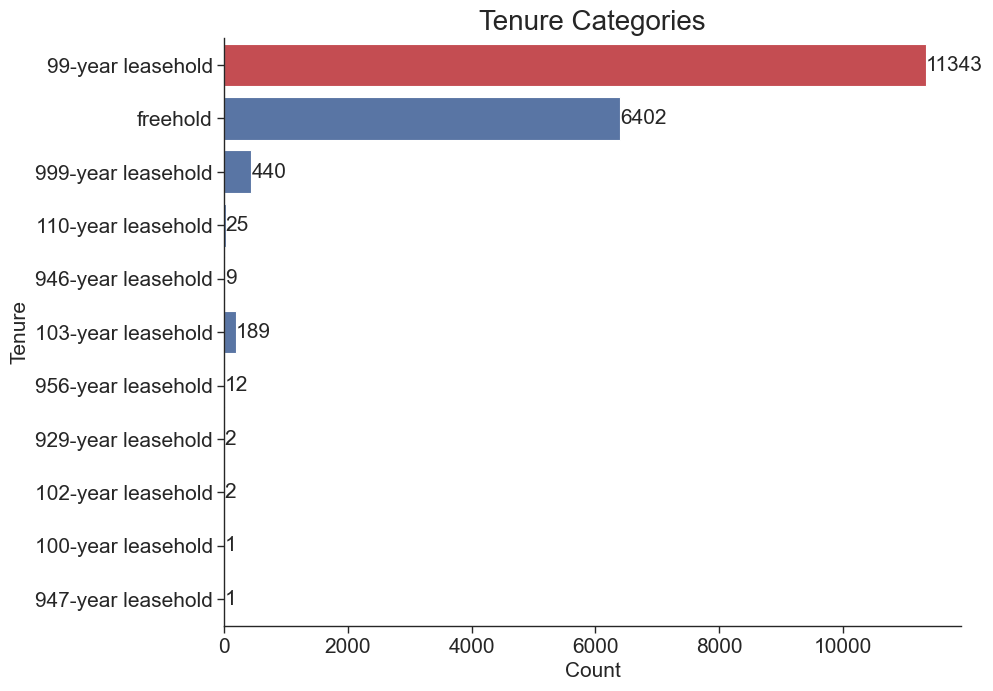

In [30]:
fig, ax = plt.subplots(figsize=(10,7))
ax = sns.countplot(y="tenure", data=df_train_cleaned, color=default_col)
ax.bar_label(ax.containers[0], fontsize=15)
sns.despine()
highlight_top(ax, "horizontal", highlight_col)
plt.title("Tenure Categories")
plt.xlabel("Count")
plt.ylabel("Tenure")
save_fig("count_tenure", img_dir)
plt.show()


- Since there are only a few instances for many of the categories, we can consider grouping them in our data preprocessing step.

### Number of bedrooms

Saving figure count_bedroom


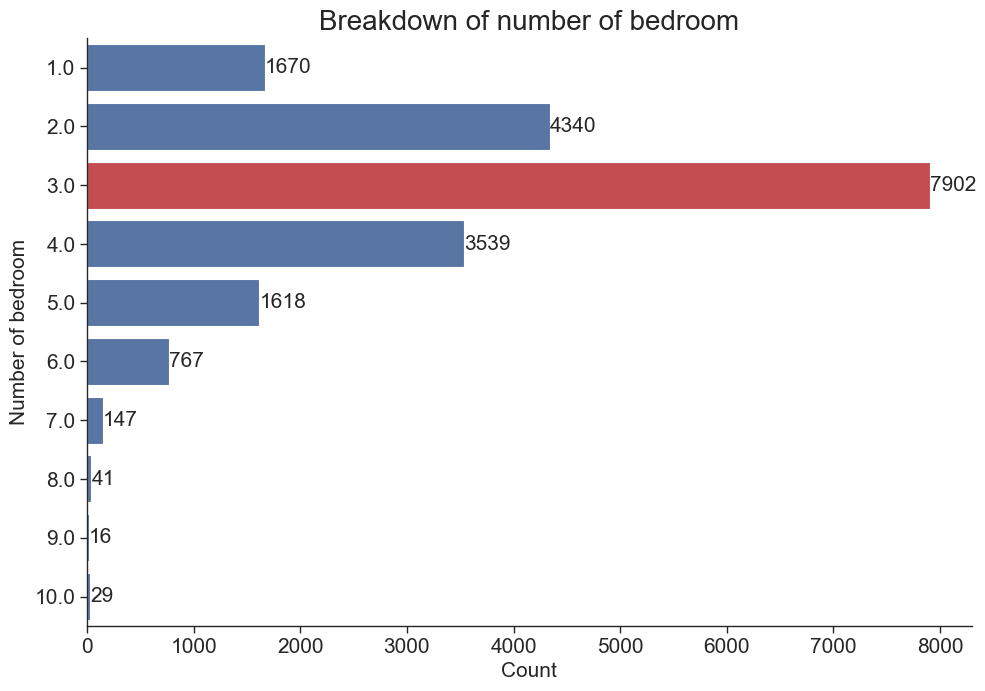

In [31]:
fig, ax = plt.subplots(figsize=(10,7))
ax = sns.countplot(y="num_beds", data=df_train_cleaned, color=default_col)
ax.bar_label(ax.containers[0], fontsize=15)
sns.despine()
highlight_top(ax, "horizontal", highlight_col)
plt.title("Breakdown of number of bedroom")
plt.xlabel("Count")
plt.ylabel("Number of bedroom")
save_fig("count_bedroom", img_dir)
plt.show()

- Similarly, we could also consider binning this feature since there are some categories with few instances

### Number of Bathrooms

Saving figure count_bathroom


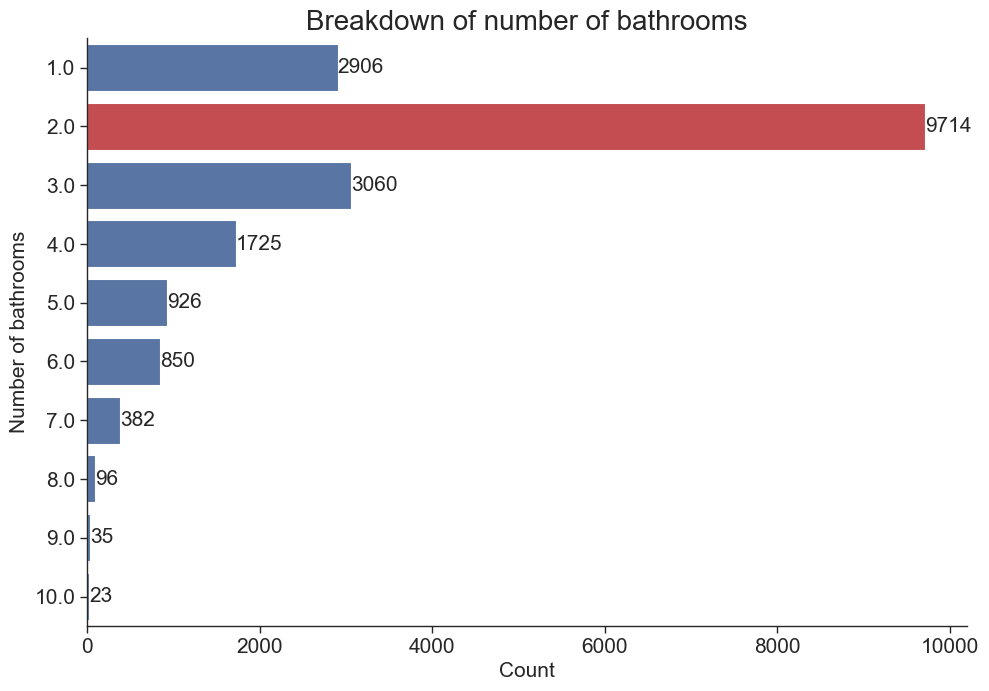

In [32]:
fig, ax = plt.subplots(figsize=(10,7))
ax = sns.countplot(y="num_baths", data=df_train_cleaned, color=default_col)
ax.bar_label(ax.containers[0], fontsize=15)
sns.despine()
highlight_top(ax, "horizontal", highlight_col)
plt.title("Breakdown of number of bathrooms")
plt.xlabel("Count")
plt.ylabel("Number of bathrooms")
save_fig("count_bathroom", img_dir)
plt.show()


- Similarly, we could also consider binning this feature since there are some categories with few instances

### Property Type

- We have to normalize ``property_type``.
- For HDB, we can remove the number of rooms under the ``property_type`` since the information about number of rooms can be represented as ``size_sqft``
- There is only 1 shophouse instances and we know that *Shophouse* is under the broader category *Walk-Up* so we will replace this.
- We will perform this in our *preprocessing.py* file since we have to do it for both train and test set

In [33]:
df_train_cleaned = clean_property_type(df_train_cleaned)

### Latitude, Longitude

In [34]:
#create a map
this_map = folium.Map(prefer_canvas=True)

In [35]:
def plotDot(point):
    '''input: series that contains a numeric named latitude and a numeric named longitude
    this function creates a CircleMarker and adds it to your this_map'''

    folium.CircleMarker(location=[point.lat, point.lng],
                        radius=2,
                        weight=5).add_to(this_map)

In [36]:
df_map = df_train_cleaned.loc[:,["lat", "lng"]]

#use df.apply(,axis=1) to "iterate" through every row in your dataframe
df_map.apply(plotDot, axis = 1)

#Set the zoom to the maximum possible
this_map.fit_bounds(this_map.get_bounds())

#Save the map to an HTML file
this_map.save('map_lat_long.html')

this_map

- There seem to be 3 dirty coordinates.
- Singapore's latitude and longitude coordinates are (1.2902, 103.8519). We will identify which data points are very far off from the coordinates
- (69.486768, 20.184434) corresponds to the point located in Norway
- (38.942776, -77.065364) corresponds to the point located in USA
- (14.484814, 121.023232) corresponds to the point located in Philippines
- Let us look into these dirty coordinates

In [37]:
dirty_lat_long = df_train_cleaned[(df_train_cleaned["lng"] < 103) | (df_train_cleaned["lng"] >= 104)]
print("There are {} dirty coordinates".format(dirty_lat_long.shape[0]))

There are 113 dirty coordinates


- Further check revealed that there is most likely a typo in the coordinates as the address is a Singapore address.
- We will create a dictionary to update those dirty records

In [38]:
dirty_lat_long["address"].unique()

array(['1 tessensohn road', '15 farrer drive', '17 farrer drive',
       '38 lorong 32 geylang', '5 jalan mutiara'], dtype=object)

In [39]:
lat_update = {"1 tessensohn road": "1.3164313",
              "15 farrer drive": "1.317319",
              "17 farrer drive": "1.317319",
              "38 lorong 32 geylang": "1.311914",
              "5 jalan mutiara": "1.295539"}

lng_update = {"1 tessensohn road": "103.8575321",
              "15 farrer drive": "103.807431",
              "17 farrer drive": "103.807431",
              "38 lorong 32 geylang": "103.886988",
              "5 jalan mutiara": "103.828318"}

subzone_update = {"1 tessensohn road": "lavender",
                  "15 farrer drive": "holland road",
                  "17 farrer drive": "holland road",
                  "38 lorong 32 geylang": "macpherson",
                  "5 jalan mutiara": "nassim"}

planning_area_update = {"1 tessensohn road": "kallang",
                        "15 farrer drive": "bukit timah",
                        "17 farrer drive": "bukit timah",
                        "38 lorong 32 geylang": "geylang",
                        "5 jalan mutiara": "tanglin"}


In [40]:
for addr in lat_update.keys():
    df_train_cleaned["lat"] = np.where(df_train_cleaned["address"] == addr, lat_update[addr], df_train_cleaned["lat"] )
    df_train_cleaned["lng"] = np.where(df_train_cleaned["address"] == addr, lng_update[addr], df_train_cleaned["lng"] )

In [41]:
# save as dict
with open("clean_data/dict_lat_update.pkl", "wb") as f:
    pickle.dump(lat_update, f)
with open("clean_data/dict_lng_update.pkl", "wb") as f:
    pickle.dump(lng_update, f)
with open("clean_data/dict_subzone_update.pkl", "wb") as f:
    pickle.dump(subzone_update, f)
with open("clean_data/dict_planning_area_update.pkl", "wb") as f:
    pickle.dump(planning_area_update, f)


In [42]:
df_train_cleaned["subzone"] = df_train_cleaned["subzone"].fillna(df_train_cleaned["address"].map(subzone_update))
df_train_cleaned["planning_area"] = df_train_cleaned["planning_area"].fillna(df_train_cleaned["address"].map(planning_area_update))

In [43]:
#df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(dirty_lat_long.index)].reset_index().drop("index", axis=1)

In [44]:
check_shape(df_train_cleaned)

There are 20149 data points and 32 features


### Planning Area

Saving figure count_planning_area


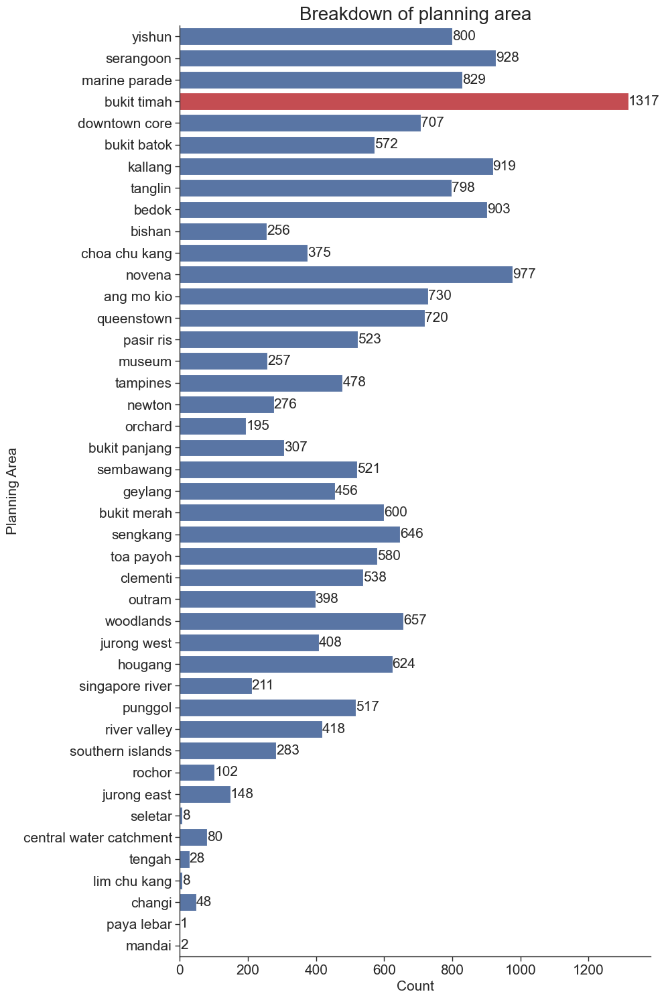

In [45]:
fig, ax = plt.subplots(figsize=(10,15))
ax = sns.countplot(y="planning_area", data=df_train_cleaned, color=default_col)
ax.bar_label(ax.containers[0], fontsize=15)
sns.despine()
highlight_top(ax, "horizontal", highlight_col)
plt.title("Breakdown of planning area")
plt.xlabel("Count")
plt.ylabel("Planning Area")
save_fig("count_planning_area", img_dir)
plt.show()


- Let's look at how price varies with the different planning area.
- We will look at the mean price of each planning area since it is difficult to visualise the disitrbution of so many planning areas

In [46]:
mean_price_area = df_train_cleaned.groupby(["planning_area"])["price"].mean().reset_index()
mean_price_area = mean_price_area.sort_values("price", ascending=False)
mean_price_area["price"] = mean_price_area["price"].apply(lambda x: x/1000000)
mean_price_area["price"] = round(mean_price_area["price"], 2)
mean_price_area = mean_price_area.rename(columns={"price": "price (in millions)"})

Saving figure planning_area_price


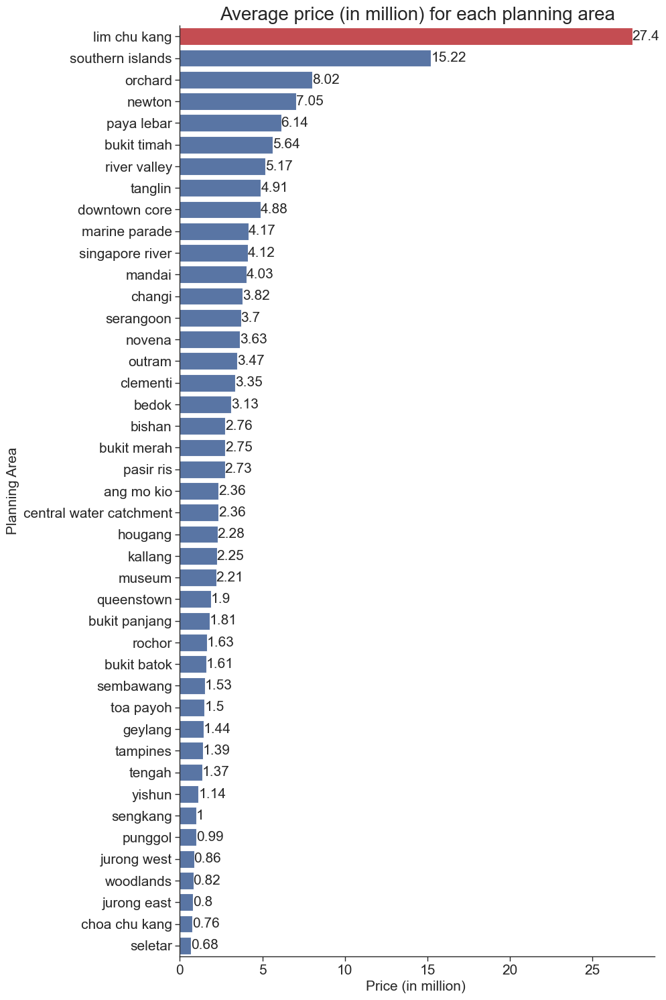

In [47]:
fig, ax = plt.subplots(figsize=(10,15))
sns.barplot(x="price (in millions)", y="planning_area", data=mean_price_area, label="Total", color=default_col)
ax.bar_label(ax.containers[0], fontsize=15)
sns.despine()
highlight_top(ax, "horizontal", highlight_col)
plt.title("Average price (in million) for each planning area")
plt.xlabel("Price (in million) ")
plt.ylabel("Planning Area")
save_fig("planning_area_price", img_dir)
plt.show()


- This feature will likely to be useful as there is a spectrum of prices across different planning area

### Furnishings

Saving figure count_furnishing


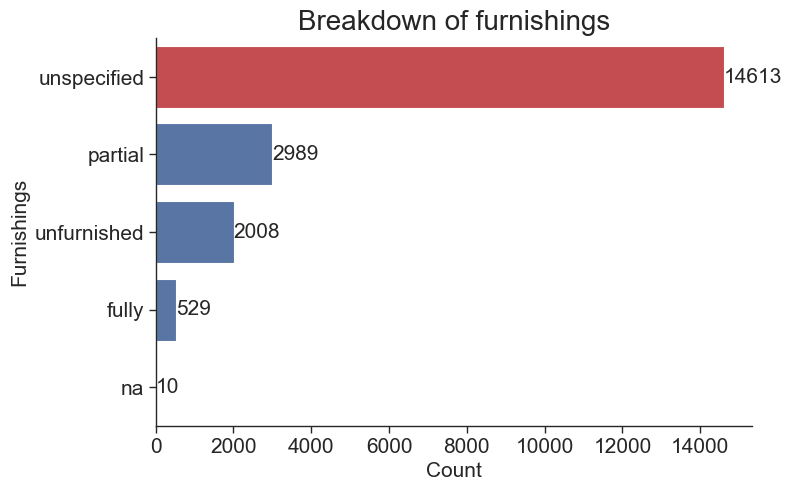

In [48]:
fig, ax = plt.subplots(figsize=(8,5))
ax = sns.countplot(y="furnishing", data=df_train_cleaned, color=default_col)
ax.bar_label(ax.containers[0], fontsize=15)
sns.despine()
highlight_top(ax, "horizontal", highlight_col)
plt.title("Breakdown of furnishings")
plt.xlabel("Count")
plt.ylabel("Furnishings")
save_fig("count_furnishing", img_dir)
plt.show()


### Total Number of Units

Saving figure dist_total_units


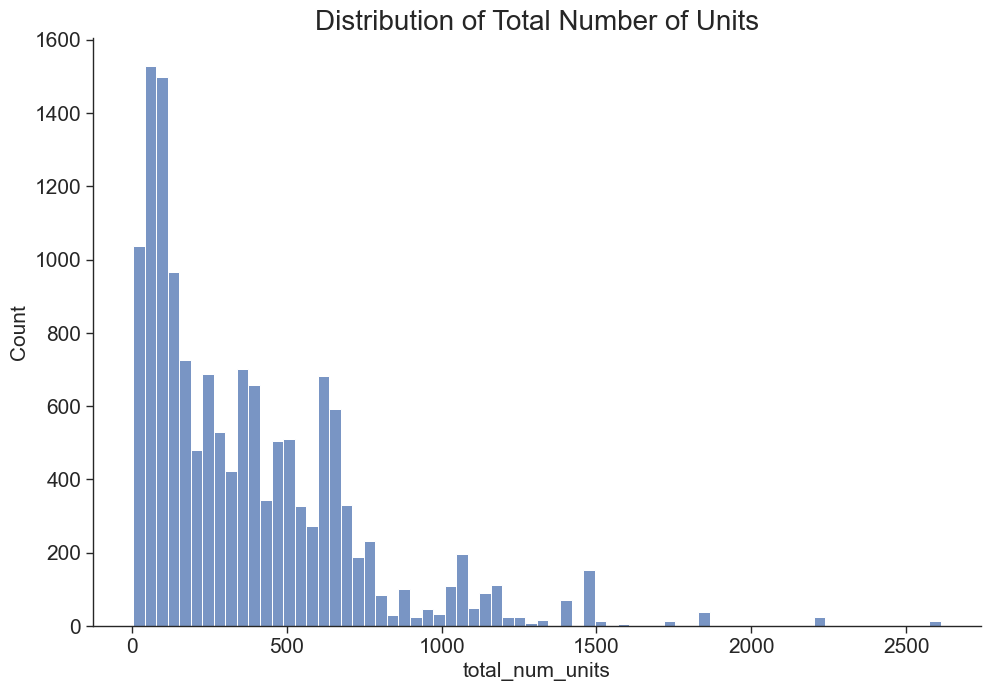

In [49]:
fig, ax = plt.subplots(figsize=(10,7))
sns.despine()
sns.histplot(df_train_cleaned["total_num_units"]).set_title("Distribution of Total Number of Units")
save_fig("dist_total_units", img_dir)
plt.show()


### Dropping columns that will not be useful

- ``listing_id``, ``title``, ``address``, ``property_name``, ``availbale_unit_types``, ``property_details_url`` can be dropped since these columns do not generally provide much value to the resale price
- In the above summary, we saw that ``elevation`` has a mean and standard deviation of 0 which means all values are the same. Thus, we can remove this column since it does not contribute to the resale price.

- We will perform this the preprocessing.py since we will have to do it on both training and testing data

In [50]:
cols_drop = ["listing_id", "title", "address", "property_name", "available_unit_types", "property_details_url", 
             "elevation"]
df_train_cleaned = df_train_cleaned.drop(cols_drop, axis=1)

In [51]:
#check_shape(df_train_cleaned)

## 4.3 Bivariate Analysis

To identify potential outliers, we can look at two variables together.

### Relationship between size sqft and prices

Saving figure size_sqft_prices


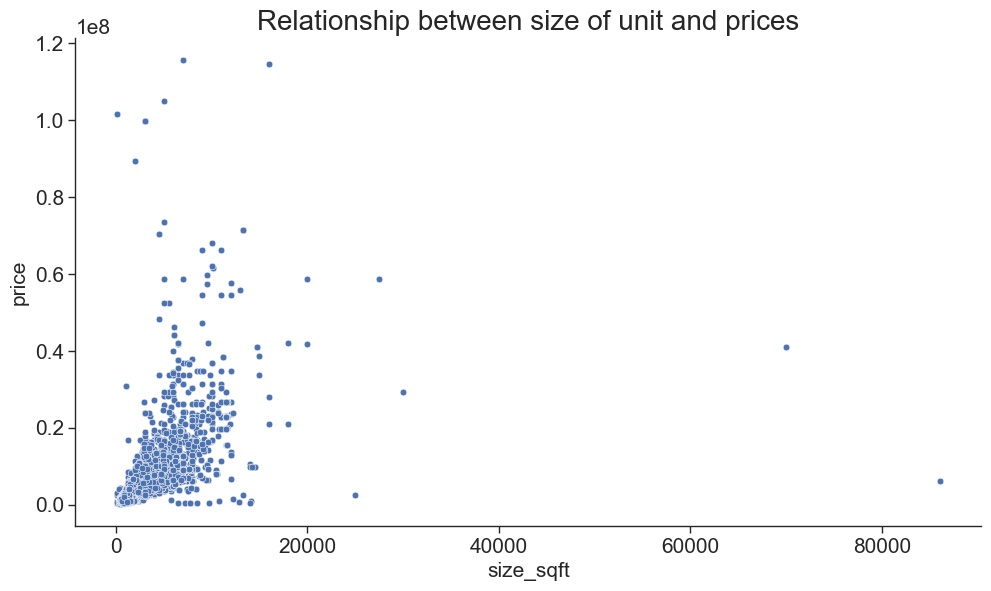

In [52]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.despine(fig,right=True)
sns.scatterplot(x="size_sqft", y="price",
                data=df_train_cleaned, ax=ax)
plt.title("Relationship between size of unit and prices")
save_fig("size_sqft_prices", img_dir)
plt.show()


- There are two points that are very far off from the rest.
- Looking at the median size_sqft for each property_type, it is not likely that these are valid size_sqft. 
- We will remove those two outliers.

In [53]:
dirty_size_sqft = df_train_cleaned[df_train_cleaned["size_sqft"] > 60000]
dirty_size_sqft

,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,total_num_units,lat,lng,subzone,planning_area,price,dist_meters_to_nearest_mrt,nearest_mrt_code,nearest_mrt_line,dist_meters_to_nearest_mall,nearest_mall_index,dist_meters_to_nearest_commercial_centre,nearest_commercial_centre_index,dist_meters_to_nearest_primary_school,nearest_primary_school_index,dist_meters_to_nearest_secondary_school,nearest_secondary_school_index
4287,semi-detached house,freehold,1970.0,6.0,7.0,86080,NaN,unspecified,NaN,1.30640765,103.93278955123664,siglap,bedok,6279000.0,2737.376243,ew6,ew,2072.647564,63,4561.662041,30,1653.976294,98,718.337468,131
15637,bungalow,freehold,1997.0,6.0,6.0,70000,NaN,unspecified,NaN,1.335877,103.789611,swiss club,bukit timah,40950000.0,709.487727,dt6,dt,501.698576,156,3251.149548,28,1510.529007,112,1528.818969,79


In [54]:
# median size_sqft for each property_type
df_train_cleaned.groupby("property_type")["size_sqft"].median()

property_type
apartment              1087.0
bungalow               7500.0
cluster house          3563.0
condo                   969.0
conservation house     3638.0
corner terrace         3639.0
executive condo        1098.0
good class bungalow    4000.0
hdb                    1022.0
hdb executive          1571.0
landed                 3068.0
semi-detached house    5000.0
terraced house         3200.0
townhouse              3853.0
walk-up                1335.0
Name: size_sqft, dtype: float64

In [55]:
check_shape(df_train_cleaned)

There are 20149 data points and 25 features


In [56]:
df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(dirty_size_sqft.index)].reset_index()

In [57]:
check_shape(df_train_cleaned)

There are 20147 data points and 26 features


Saving figure size_sqft_prices_clean


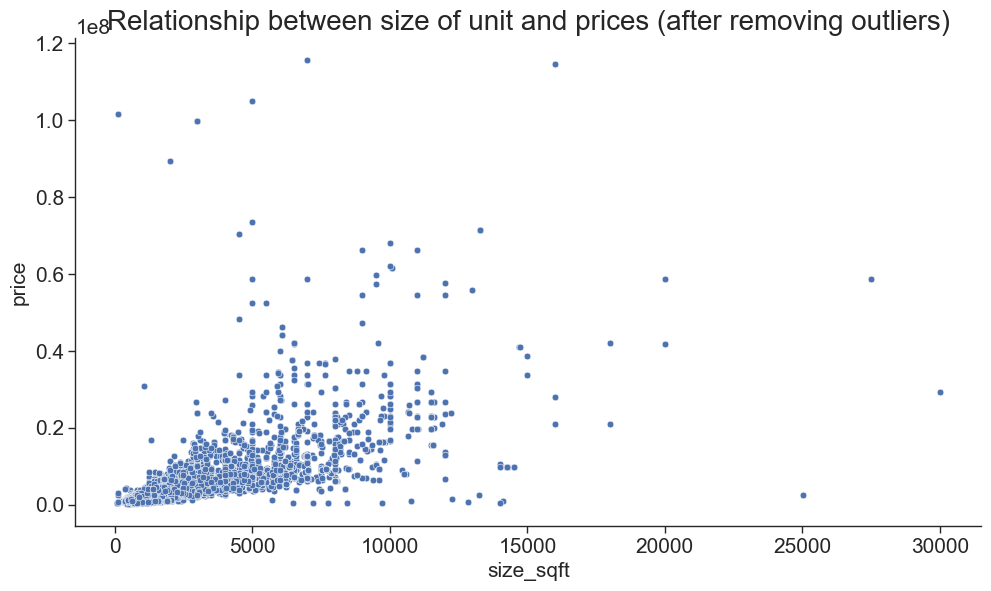

In [58]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.despine(fig,right=True)
sns.scatterplot(x="size_sqft", y="price",
                data=df_train_cleaned, ax=ax)
plt.title("Relationship between size of unit and prices (after removing outliers)")
save_fig("size_sqft_prices_clean", img_dir)
plt.show()


- In general, there is positive correlation between the size of unit and the resale price as we would expect. Thus, this should be a strong feature for our model.

### Relationship between Size and Property Type

- We have seen that size of unit is a strong feature. Let's explore further and see how size and property type are related

Saving figure size_sqft_property


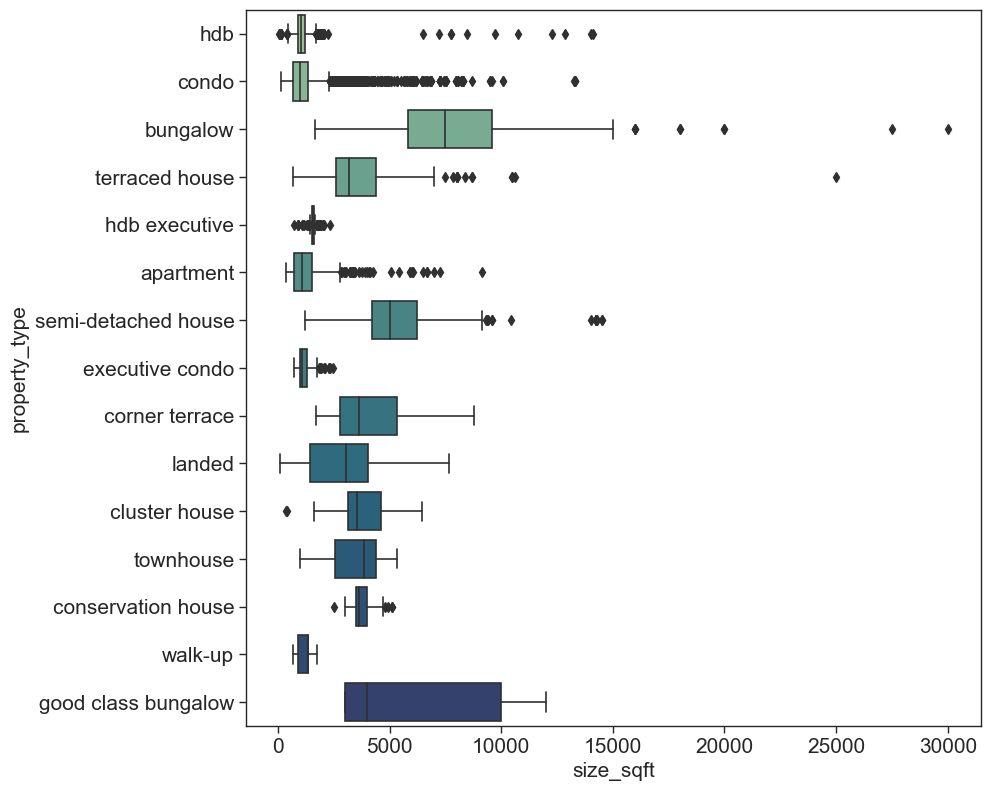

In [59]:
fig, ax = plt.subplots(figsize=(10,8))
sns.boxplot(x="size_sqft", y="property_type", data=df_train_cleaned, palette="crest")
save_fig("size_sqft_property", img_dir)
plt.show()


- It seems like a terraced house unit with 25K size_sqft unit is quite an outlier. Let's take a closer look

In [60]:
dirty_sizesqft = df_train_cleaned[(df_train_cleaned["property_type"] == "terraced house") & (df_train_cleaned["size_sqft"] > 25000)]
dirty_sizesqft

,index,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,total_num_units,lat,lng,subzone,planning_area,price,dist_meters_to_nearest_mrt,nearest_mrt_code,nearest_mrt_line,dist_meters_to_nearest_mall,nearest_mall_index,dist_meters_to_nearest_commercial_centre,nearest_commercial_centre_index,dist_meters_to_nearest_primary_school,nearest_primary_school_index,dist_meters_to_nearest_secondary_school,nearest_secondary_school_index
13384,13461,terraced house,99-year leasehold,1997.0,6.0,5.0,25003,NaN,unspecified,339.0,1.3524815,103.6990818559336,yunnan,jurong west,2625000.0,1658.5659,ew28,ew,404.754815,160,474.412284,11,579.520788,160,325.936191,133


- There is no good reason why this is a valid size_sqft as the unit is located in Jurong West. Compared to the 2 extreme units in bungalow which has more bedrooms and bathrooms, the size_sqft is not justifiable. Hence, we will remove it from our training dataset

In [61]:
# look at the top 2 extreme bungalow units.
df_train_cleaned[(df_train_cleaned["property_type"] == "bungalow") & (df_train_cleaned["size_sqft"] > 25000)]

,index,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,total_num_units,lat,lng,subzone,planning_area,price,dist_meters_to_nearest_mrt,nearest_mrt_code,nearest_mrt_line,dist_meters_to_nearest_mall,nearest_mall_index,dist_meters_to_nearest_commercial_centre,nearest_commercial_centre_index,dist_meters_to_nearest_primary_school,nearest_primary_school_index,dist_meters_to_nearest_secondary_school,nearest_secondary_school_index
1640,1649,bungalow,freehold,2011.0,10.0,10.0,30000,NaN,unspecified,NaN,1.34602025,103.86719776832936,lorong chuan,serangoon,29400000.0,664.704399,cc14,cc,745.291917,110,810.479250,31,334.444461,170,374.308882,147
13511,13589,bungalow,freehold,1990.0,8.0,9.0,27500,NaN,unspecified,17.0,1.3119251,103.8240011,nassim,tanglin,58800000.0,927.867041,dt10,dt,785.774513,50,2336.445562,29,1445.437595,6,1192.455643,114


In [62]:
df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(dirty_size_sqft.index)]

In [63]:
check_shape(df_train_cleaned)

There are 20145 data points and 26 features


### Relationship between Tenure and Prices

Saving figure tenure_price


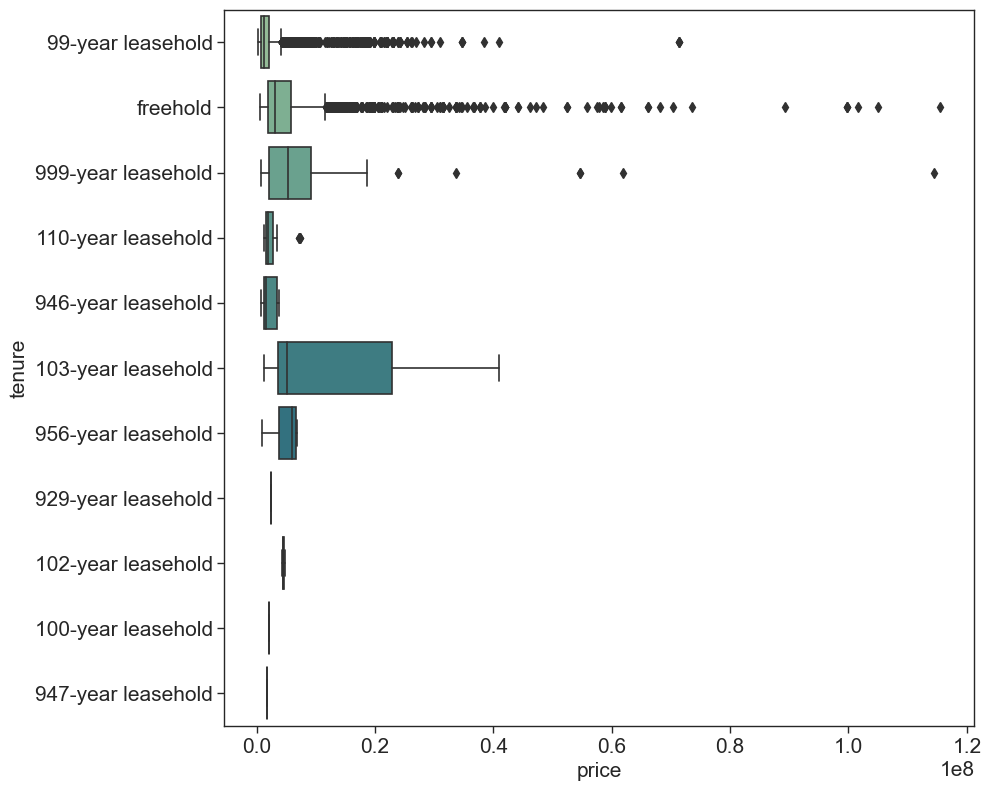

In [64]:
fig, ax = plt.subplots(figsize=(10,8))
sns.boxplot(x="price", y="tenure", data=df_train_cleaned, palette="crest")
save_fig("tenure_price", img_dir)
plt.show()


- Under the 999 year leasehold, there is a data point that is very far off from the other points.
- Under the 99 year leasehold, there is also one data point that is very far off from the other points

In [65]:
dirty_tenure999_price = df_train_cleaned[(df_train_cleaned["tenure"] == "999-year leasehold") & (df_train_cleaned["price"] > 1*10**8)]
dirty_tenure999_price

,index,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,total_num_units,lat,lng,subzone,planning_area,price,dist_meters_to_nearest_mrt,nearest_mrt_code,nearest_mrt_line,dist_meters_to_nearest_mall,nearest_mall_index,dist_meters_to_nearest_commercial_centre,nearest_commercial_centre_index,dist_meters_to_nearest_primary_school,nearest_primary_school_index,dist_meters_to_nearest_secondary_school,nearest_secondary_school_index
18988,19091,bungalow,999-year leasehold,1989.0,10.0,10.0,16000,NaN,unspecified,NaN,1.3176585,103.7905776,leedon park,bukit timah,114450000.0,882.433582,cc21,cc,924.908616,19,1237.472262,28,711.066275,66,1724.939029,60


In [66]:
dirty_tenure99_price = df_train_cleaned[(df_train_cleaned["tenure"] == "99-year leasehold") & (df_train_cleaned["price"] > 0.6*10**8)]
dirty_tenure99_price

,index,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,total_num_units,lat,lng,subzone,planning_area,price,dist_meters_to_nearest_mrt,nearest_mrt_code,nearest_mrt_line,dist_meters_to_nearest_mall,nearest_mall_index,dist_meters_to_nearest_commercial_centre,nearest_commercial_centre_index,dist_meters_to_nearest_primary_school,nearest_primary_school_index,dist_meters_to_nearest_secondary_school,nearest_secondary_school_index
754,760,condo,99-year leasehold,2011.0,5.0,NaN,13293,NaN,unfurnished,1129.0,1.2667184,103.811492599035,maritime square,bukit merah,71400000.0,481.22402,cc28,cc,981.617754,143,2428.480008,25,1112.005202,13,1665.569621,29
1915,1928,condo,99-year leasehold,2011.0,5.0,NaN,13293,NaN,unfurnished,1129.0,1.2667184,103.811492599035,maritime square,bukit merah,71400000.0,481.22402,cc28,cc,981.617754,143,2428.480008,25,1112.005202,13,1665.569621,29
10882,10949,condo,99-year leasehold,2011.0,5.0,NaN,13293,NaN,unfurnished,1129.0,1.2667184,103.811492599035,maritime square,bukit merah,71400000.0,481.22402,cc28,cc,981.617754,143,2428.480008,25,1112.005202,13,1665.569621,29


- Let's look into the distribution of ``property_type`` for each leasehold category to confirm that they are indeed outliers.
- Comparing the same property type with same tenure, the above four data points are indeed outliers as they are very far off from usual prices

In [67]:
df_999year = df_train_cleaned[df_train_cleaned["tenure"] == "999-year leasehold"]
df_99year = df_train_cleaned[df_train_cleaned["tenure"] == "99-year leasehold"]

Saving figure tenure_property_price


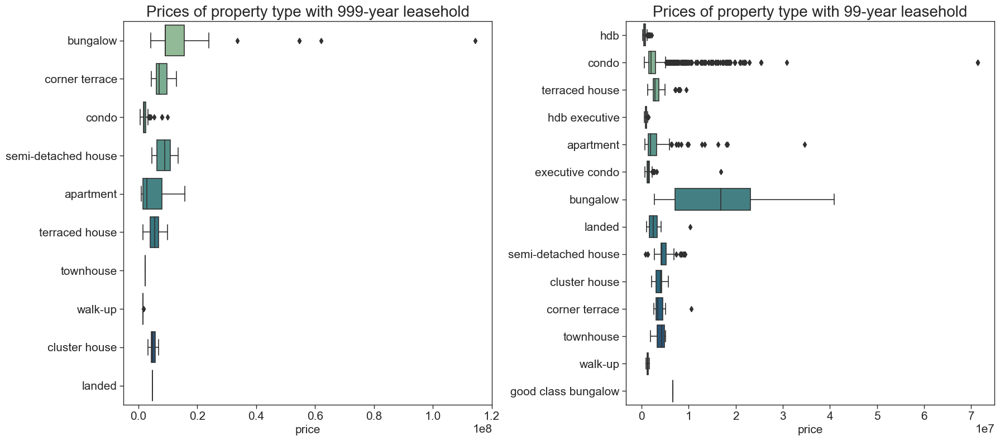

In [68]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,8))
sns.boxplot(x="price", y="property_type", data=df_999year, ax=ax1, palette="crest")
ax1.set_title('Prices of property type with 999-year leasehold')
ax1.set_ylabel('')
sns.boxplot(x="price", y="property_type", data=df_99year, ax=ax2, palette="crest")
ax2.set_title('Prices of property type with 99-year leasehold')
ax2.set_ylabel('')
plt.tight_layout()
save_fig("tenure_property_price", img_dir)
plt.show()


In [69]:
check_shape(df_train_cleaned)

There are 20145 data points and 26 features


In [70]:
df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(dirty_tenure999_price.index)]
df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(dirty_tenure99_price.index)]

In [71]:
check_shape(df_train_cleaned)

There are 20141 data points and 26 features


### Relationship between number of bedrooms and prices

Saving figure bedroom_price


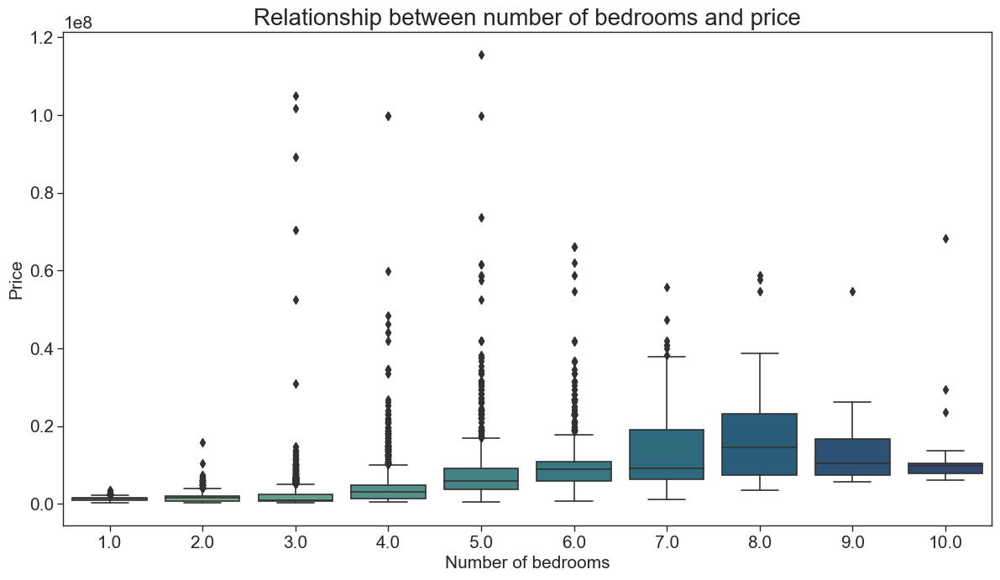

In [72]:
fig, ax = plt.subplots(figsize=(12,7))
sns.boxplot(x="num_beds", y="price", data=df_train_cleaned, palette="crest")
ax.set_xlabel("Number of bedrooms")
ax.set_ylabel("Price")
ax.set_title("Relationship between number of bedrooms and price")
save_fig("bedroom_price", img_dir)
plt.show()


- As the number of bedrooms increases, the higher the resale price. As there is clear pattern, this feature would surely be very useful for our model prediction

### Relationship between number of bedrooms and bathrooms

In [73]:
bed_baths_count = df_train_cleaned.groupby(["num_beds", "num_baths"]).size().reset_index()
bed_baths_count.columns.values[bed_baths_count.columns == 0] = 'count'

In [74]:
# Compute a size variable for the markers so that they have a good size regardless
# of the total count and the number of unique values in each categorical variable
scale = 60*bed_baths_count['count'].size
size = bed_baths_count['count']/bed_baths_count['count'].sum()*scale

Saving figure num_baths_beds


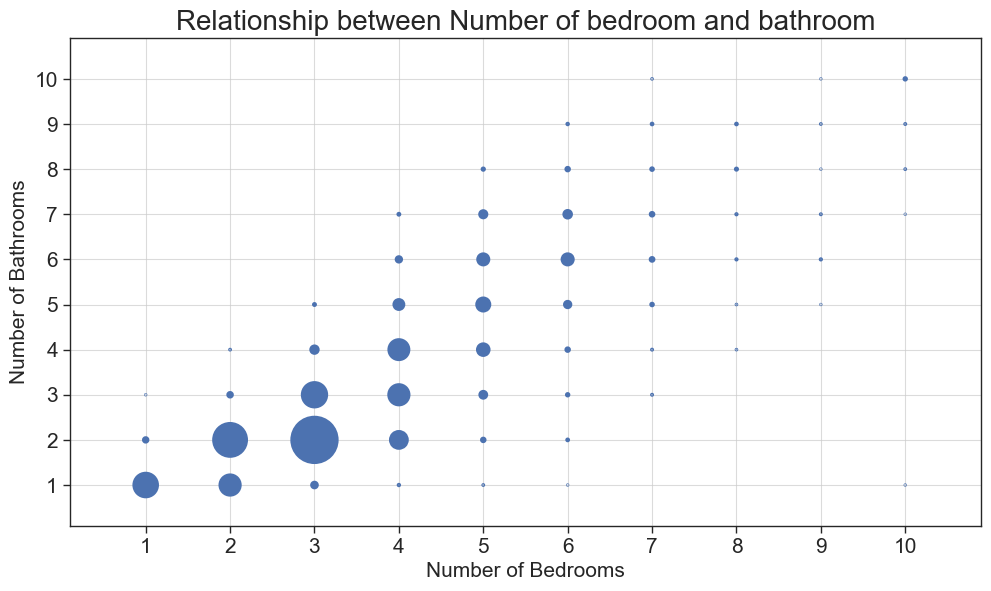

In [75]:
fig, ax = plt.subplots(figsize=(10,6))
ax.scatter("num_beds", "num_baths", size, data=bed_baths_count, 
           zorder=2, linewidth=2)
ax.grid(linestyle='-', alpha=0.7, zorder=1)
ax.tick_params(length=5)
ax.set_frame_on(True)
plt.xticks([1,2,3,4,5,6,7,8,9,10])
plt.xlabel("Number of Bedrooms")
plt.yticks([1,2,3,4,5,6,7,8,9,10])
plt.ylabel("Number of Bathrooms")
plt.title("Relationship between Number of bedroom and bathroom")
ax.margins(0.1)
save_fig("num_baths_beds", img_dir)
plt.show()


- Since the number of bedrooms is positively correlated to the number of bathrooms, we could use this information to fill in any missing values if there are any.

Saving figure bath_beds_property


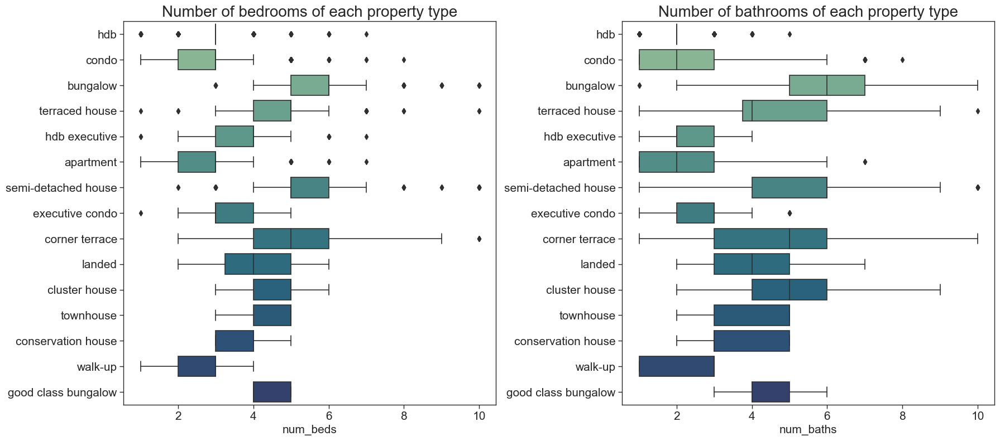

In [76]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,8))
sns.boxplot(x="num_beds", y="property_type", data=df_train_cleaned, ax=ax1, palette="crest")
ax1.set_title('Number of bedrooms of each property type')
ax1.set_ylabel('')
sns.boxplot(x="num_baths", y="property_type", data=df_train_cleaned, ax=ax2, palette="crest")
ax2.set_title('Number of bathrooms of each property type')
ax2.set_ylabel('')
plt.tight_layout()
save_fig("bath_beds_property", img_dir)
plt.show()


- Since the number of bedrooms and bathrooms vary for the different property type, we could perhaps use this information when filling in any missing values.

### Furnishings and Prices

Saving figure furnishing_price


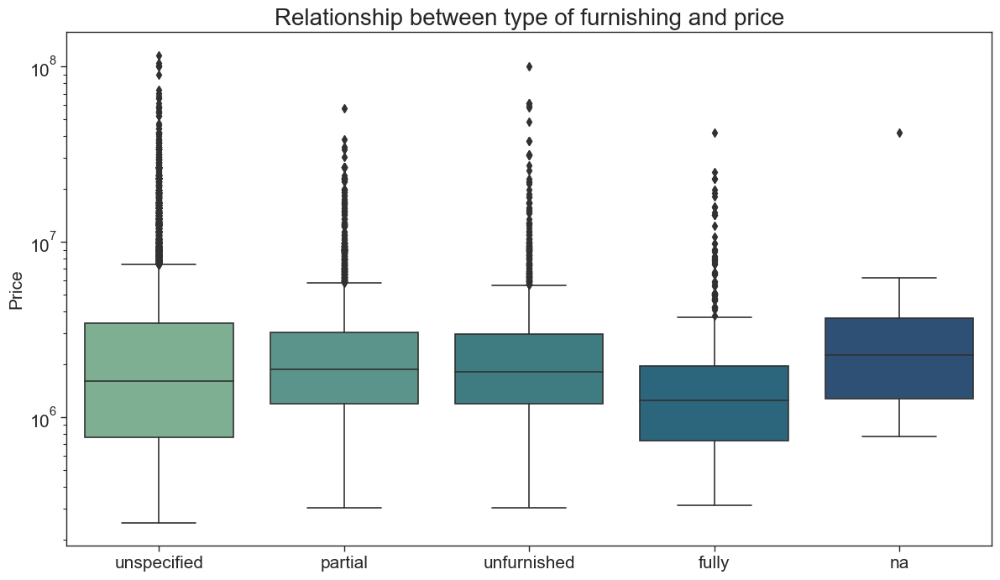

In [77]:
fig, ax = plt.subplots(figsize=(12,7))
g = sns.boxplot(x="furnishing", y="price", data=df_train_cleaned, palette="crest")
g.set_yscale('log')
ax.set_xlabel("")
ax.set_ylabel("Price")
ax.set_title("Relationship between type of furnishing and price")
save_fig("furnishing_price", img_dir)
plt.show()


- The type of furnishing does not seem to have any clear pattern hence may not be useful for our model prediction

In [78]:
df_train_cleaned = df_train_cleaned.drop("furnishing", axis=1).reset_index().drop("index", axis=1)

### Relationship between total number of units and prices

Saving figure total_units_price


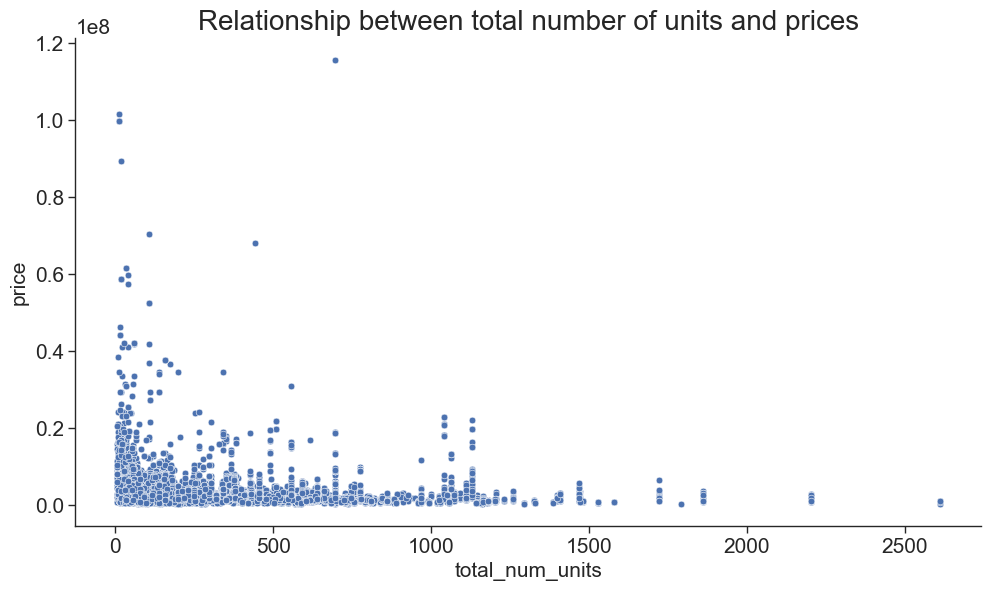

In [79]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.despine(fig,right=True)
sns.scatterplot(x="total_num_units", y="price",
                data=df_train_cleaned, ax=ax)
plt.title("Relationship between total number of units and prices")
save_fig("total_units_price", img_dir)
plt.show()


- There is no clear pattern so ``total_num_units`` will not be very useful for our prediction

In [80]:
df_train_cleaned = df_train_cleaned.drop("total_num_units", axis=1).reset_index().drop("index", axis=1)

## 4.4 Auxiliary Data

### Subzone

- We can sum up the total population by ``planning area`` and see if there is any relationship with the ``price``

In [81]:
dict_subzone_pop = df_subzone.groupby("planning_area")["population"].sum().to_dict()
df_train_cleaned["total_population"] = df_train_cleaned["planning_area"].map(dict_subzone_pop)


Saving figure aux_total_pop_price


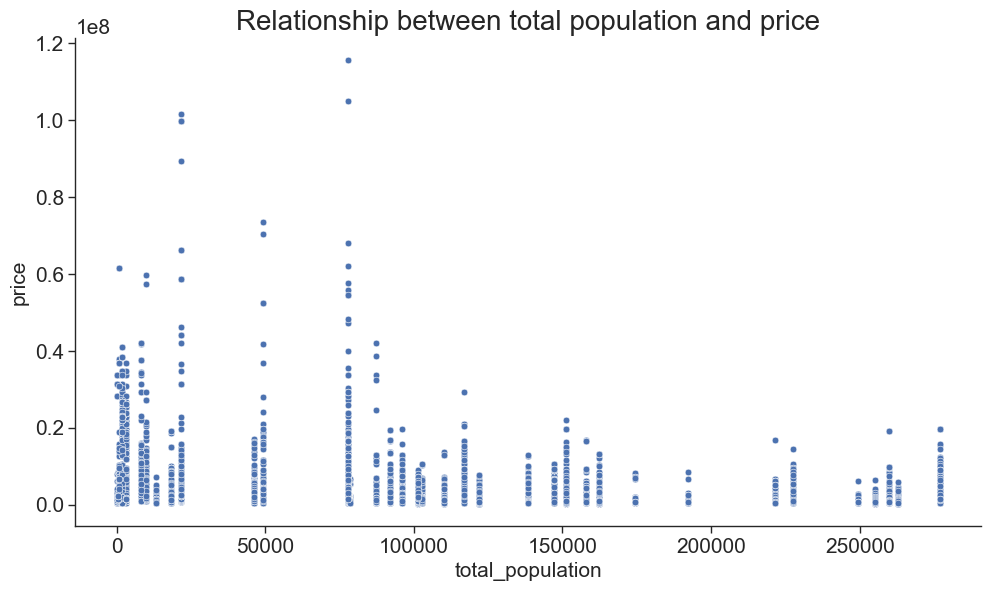

In [82]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.despine(fig,right=True)
sns.scatterplot(x="total_population", y="price",
                data=df_train_cleaned, ax=ax)
plt.title("Relationship between total population and price")
save_fig("aux_total_pop_price", img_dir)
plt.show()


- There is no clear pattern between total population and price so most likely this feature will not be very useful. We shall remove it from our training data

In [83]:
df_train_cleaned = df_train_cleaned.drop("total_population",axis=1)

### Community Facilities

In [84]:
# The index of the nearest facility of interest, or MRT station code, is not likely to be useful.
df_train_cleaned = df_train_cleaned.drop(['nearest_mrt_code',
                                          'nearest_mall_index',
                                          'nearest_commercial_centre_index',
                                          'nearest_primary_school_index',
                                          'nearest_secondary_school_index'], axis=1)


The distance to community facilities such as MRT stations, schools and malls may have impcat on the price of the property.

- Since the distribution of price is skewed to the right, using log-scale can aid a better visualization.
- Properties near CE (Marina Bay and Bayfront) and CG (Changi Airpot) lines have a higher price than other lines.
- For the distance to MRT stations, there is not a clear relationship shown.

Saving figure aux_mrt_line_pop_price


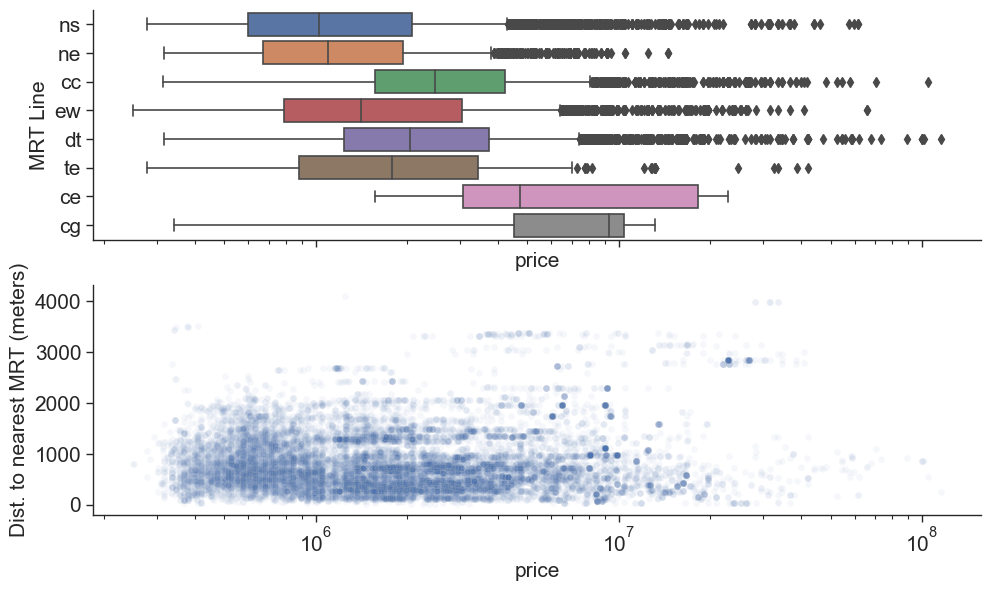

In [85]:
fig, ax = plt.subplots(nrows=2, figsize=(10, 6), sharex=True)
sns.despine(fig, right=True)
g = sns.boxplot(x="price", y="nearest_mrt_line",
                data=df_train_cleaned, ax=ax[0])
g.set_xscale('log')
g.set_ylabel('MRT Line')

h = sns.scatterplot(x="price", y="dist_meters_to_nearest_mrt",
            data=df_train_cleaned, alpha=0.05, ax=ax[1])
h.set_ylabel('Dist. to nearest MRT (meters)')

save_fig("aux_mrt_line_pop_price", img_dir)
plt.show()


The plots of the nearest distance to other community facilities are shown below. There does not seem to be a clear relationship.

Saving figure aux_distance_to_facilities_price


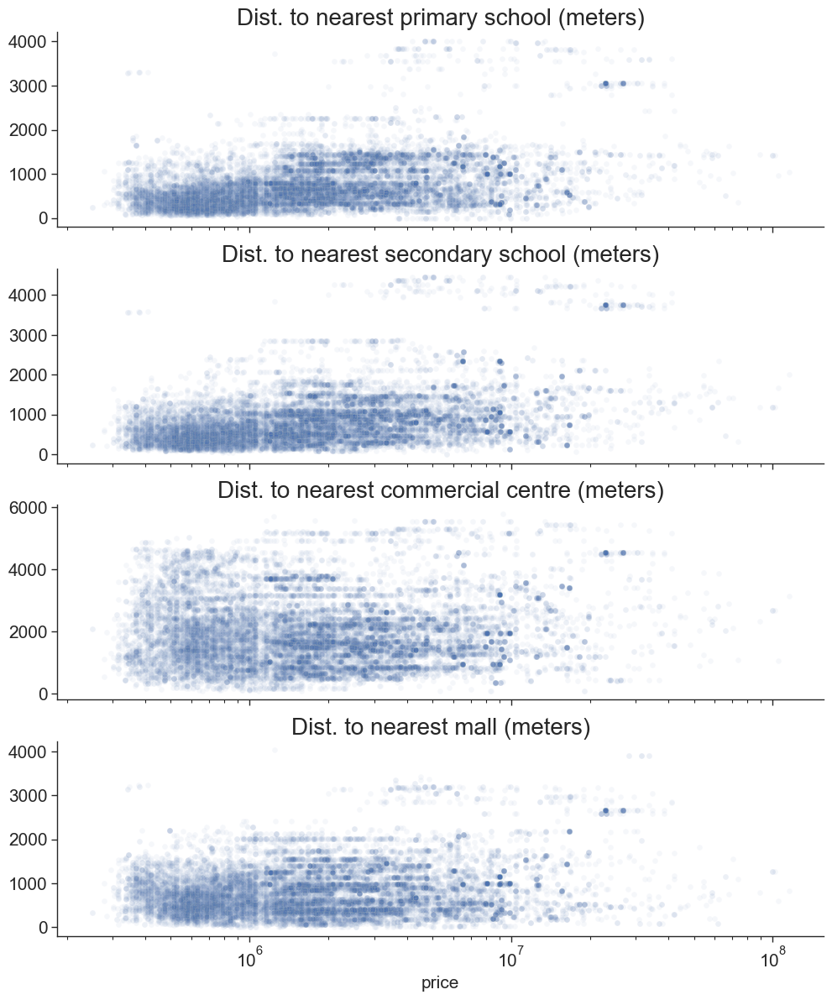

In [86]:
fig, ax = plt.subplots(nrows=4, figsize=(10, 12), sharex=True)
sns.despine(fig, right=True)

h = sns.scatterplot(x="price", y="dist_meters_to_nearest_primary_school",
                data=df_train_cleaned, alpha=0.05, ax=ax[0])
h.set_xscale('log')
h.set_ylabel('')
h.set_title('Dist. to nearest primary school (meters)')

h = sns.scatterplot(x="price", y="dist_meters_to_nearest_secondary_school",
                data=df_train_cleaned, alpha=0.05, ax=ax[1])
h.set_title('Dist. to nearest secondary school (meters)')
h.set_ylabel('')

h = sns.scatterplot(x="price", y="dist_meters_to_nearest_commercial_centre",
                data=df_train_cleaned, alpha=0.05, ax=ax[2])
h.set_title('Dist. to nearest commercial centre (meters)')
h.set_ylabel('')

h = sns.scatterplot(x="price", y="dist_meters_to_nearest_mall",
                data=df_train_cleaned, alpha=0.05, ax=ax[3])
h.set_title('Dist. to nearest mall (meters)')
h.set_ylabel('')

save_fig("aux_distance_to_facilities_price", img_dir)
plt.show()


## 4.5 Missing Value

In [87]:
df_train_cleaned_missing = df_train_cleaned.copy()
df_train_cleaned_missing = df_train_cleaned_missing.drop("level_0", axis=1)

Saving figure missing_value


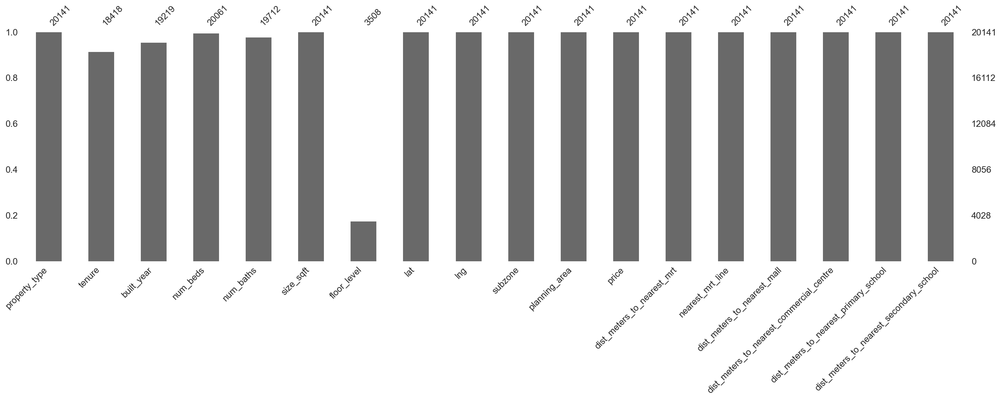

In [88]:
msno.bar(df_train_cleaned_missing)
save_fig("missing_value", img_dir)

In [89]:
missing_values_table(df_train_cleaned_missing)

Your selected dataframe has 18 columns.
There are 5 columns that have missing values.


,Missing Values,% of Total Values
floor_level,16633,82.6
tenure,1723,8.6
built_year,922,4.6
num_baths,429,2.1
num_beds,80,0.4


####  Without handling missing values

In [90]:
def no_handling_missing_values(data):
    data = data.drop("floor_level", axis=1)
    lease_hdb = ["hdb", "hdb executive"]
    data["tenure"] = data["tenure"].fillna(pd.Series(np.where((data["property_type"].isin(lease_hdb)), "99-year leasehold", pd.NA )))
    return data

####  Handling missing values

- We will drop ``floor_level`` as there are too many missing values (79%!)
- For ``tenure``, we can infer from the property type. We know that HDB has a tenure of 99 years so we can impute this information to our data
- For the remaining missing ``tenure`` for non-hdb, we shall impute the most occuring ``tenure`` value by ``property_type``.We will save this file so that we can apply it on our test set
- For ``num_beds`` and ``num_baths``, we will get the most commonly occuring value according to ``property_type``. Similarly, we will save this file so that we can apply it on our test set.
- For missing ``built_year``, we can take the median of built year according to the subzone. Our hypothesis is that buildings in a subzone are usually built together.
- If there are still missing ``built_year``, then it could mean that the subzone was newly formed. Hence, we will impute the current year 

In [91]:
def yes_handling_missing_values(data):
    
    data = data.drop("floor_level", axis=1)
    
    ############
    ## Tenure ##
    ############
    # fill missing tenure using property_type
    lease_hdb = ["hdb", "hdb executive"]
    data["tenure"] = data["tenure"].fillna(pd.Series(np.where((data["property_type"].isin(lease_hdb)), "99-year leasehold", pd.NA )))
    
    dict_tenure = data.groupby(["property_type"])["tenure"].apply(lambda x: x.value_counts().index[0]).to_dict()
    data["tenure"] = data["tenure"].fillna(data["property_type"].map(dict_tenure))
    
    # save dictionary for preprocessing step
    with open("clean_data/dict_tenure.pkl", "wb") as f:
        pickle.dump(dict_tenure, f)
    
    #################
    ## Beds, Baths ##
    #################
    # fill number of bedroom and bathroom using mean number of same property
    property_bed_bath_group = data.groupby(["property_type", "num_baths", "num_beds"]).size().reset_index()
    property_bed_bath_group.columns.values[property_bed_bath_group.columns == 0] = "count"
    # most common num_baths, num_beds according to property_type
    idx = property_bed_bath_group.groupby(["property_type"])["count"].transform(max) == property_bed_bath_group["count"]
    property_bed_bath_group = property_bed_bath_group[idx]
    # if there are multiple property_type with same count of num_baths and num_beds, then take the first one.
    property_bed_bath_group = property_bed_bath_group.drop_duplicates(subset=["property_type"], keep="first").drop("count", axis=1)
    
    # save to dictionary
    dict_bed_bath = property_bed_bath_group.set_index("property_type").T.to_dict("records")
    # save dictionary for preprocessing step
    # num_baths [0] and num_beds [1] entry in dictionary
    with open("clean_data/dict_bed_bath.pkl", "wb") as f:
        pickle.dump(dict_bed_bath, f)

    data["num_baths"] = data["num_baths"].fillna(data["property_type"].map(dict_bed_bath[0]))
    data["num_beds"] = data["num_beds"].fillna(data["property_type"].map(dict_bed_bath[1]))
    
    ################
    ## Built Year ##
    ################
    # take median built_year of each subzone
    dict_built_year_subzone = data.groupby(["subzone"])["built_year"].median().to_dict()
    with open("clean_data/dict_built_year_subzone.pkl", "wb") as f:
        pickle.dump(dict_built_year_subzone, f)
        
    data["built_year"] = data["built_year"].fillna(data["subzone"].map(dict_built_year_subzone))
    
    # if there are still missing built_year, then we will fill it with current year 2022 since it could
    # very likely be a newly formed subzone.
        
    data["built_year"] = data["built_year"].fillna(2022)
    
    return data


In [92]:
df_train_no_missing = yes_handling_missing_values(df_train_cleaned_missing)

In [93]:
missing_values_table(df_train_no_missing)

Your selected dataframe has 17 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


In [94]:
df_train_no_missing = df_train_no_missing.drop("subzone", axis=1)

# Preprocessing

### Feature engineering

- As shown in above EDA, since there are many categories in ``tenure`` with low count, we can group them together.
- We can compute the number of active years by subtracting ``built_year`` from current year
- We can target encode ``planning_area`` by replacing the values with the mean price 
- We perform one hot encoding on ``tenure`` and ``property_type``
- In our test set, we have one planning area "Boon Lay" that is not present in our training set. As a result, we wont be able to target encode the "Boon Lay". We know that "Boon Lay" is near "Jurong West" so we will impute that value instead

In [104]:
df_train_preproc = df_train_no_missing.copy()

In [105]:
dict_target_encode = df_train_preproc.groupby(["planning_area"])["price"].mean().to_dict()
with open("clean_data/dict_target_encode.pkl", "wb") as f:
        pickle.dump(dict_target_encode, f)

In [106]:
df_train_preproc = create_features(df_train_preproc)

In [107]:
df_train_preproc = df_train_preproc.drop(["property_type", "tenure", "built_year", "nearest_mrt_line", "planning_area"], axis=1)

In [108]:
df_train_preproc.to_csv("clean_data/train_preproc.csv")

In [120]:
check_shape(df_train_preproc)

There are 20141 data points and 39 features


- Next, we will process the test set similarly

In [109]:
df_test_aux = pd.read_csv(Path(data_dir, 'test_auxiliary_data.csv'), index_col=0)
df_test = df_test.join(df_test_aux)

In [110]:
df_test_clean = clean_property_type(df_test)
df_test_clean = fill_missing_values(df_test_clean)
df_test_clean = update_data(df_test_clean)
df_test_clean = drop_columns(df_test_clean)

In [111]:
missing_values_table(df_test_clean)

Your selected dataframe has 15 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


In [112]:
df_test_preproc = create_features(df_test_clean)

In [113]:
df_test_preproc[(pd.isnull(df_test_preproc["planning_area"]))]

,property_type,tenure,built_year,num_beds,num_baths,size_sqft,lat,lng,planning_area,dist_meters_to_nearest_mrt,nearest_mrt_line,dist_meters_to_nearest_mall,dist_meters_to_nearest_commercial_centre,dist_meters_to_nearest_primary_school,dist_meters_to_nearest_secondary_school,active_years,planning_area_mean,tenure_99-Year Leasehold,tenure_Freehold,tenure_Others,property_type_apartment,property_type_bungalow,property_type_cluster house,property_type_condo,property_type_conservation house,property_type_corner terrace,property_type_executive condo,property_type_good class bungalow,property_type_hdb,property_type_hdb executive,property_type_landed,property_type_semi-detached house,property_type_terraced house,property_type_townhouse,property_type_walk-up,nearest_mrt_line_cc,nearest_mrt_line_ce,nearest_mrt_line_cg,nearest_mrt_line_dt,nearest_mrt_line_ew,nearest_mrt_line_ne,nearest_mrt_line_ns,nearest_mrt_line_te


In [114]:
# since all values will be the same, doesn't matter if we take max
jurong_west_price_mean = df_test_preproc[df_test_preproc["planning_area"] == "jurong west"]["planning_area_mean"].max()

In [115]:
jurong_west_price_mean

862437.7450980392

In [116]:
df_test_preproc["planning_area_mean"] = np.where(df_test_preproc["planning_area"]=="boon lay",  jurong_west_price_mean, df_test_preproc["planning_area_mean"])

In [117]:
df_test_preproc = df_test_preproc.drop(["property_type", "tenure", "nearest_mrt_line", "built_year", "planning_area"], axis=1)

In [118]:
df_test_preproc.to_csv("clean_data/test_preproc.csv")

In [119]:
check_shape(df_test_preproc)

There are 7000 data points and 38 features
